# Bài tập về nhà: Kỹ thuật tăng cường tương phản ảnh
Trong phần này học viên cần thực hiện:

- Cài đặt phương pháp hiệu chỉnh gama trên ảnh đa mức xám (nếu chưa hoàn thành trên lớp)
- Thực hiện tăng cường độ tương phản trên ảnh màu với các chiến lược tăng cường độ tương phản khác nhau (histogram equalization, hiệu chỉnh gama, kéo giãn histogram, ...)
- Cân bằng động histogram (dynamic histogram equalization) - không bắt buộc

# Ảnh thực hành

In [3]:
import cv2
import matplotlib.pyplot as plt
import os

In [9]:
img_names = os.listdir('testdata/')

In [1]:
img_names = os.listdir('testdata/')
plt.figure(figsize=(18, 18)) 
for i, img_name in enumerate(img_names):
    img = cv2.imread(os.path.join('testdata/', img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # for showing purpose
    plt.subplot(4,2,i+1)
    plt.imshow(img) 
plt.show()

# Copy hàm gamma correction (cho ảnh đa mức xám), để sử dụng lại trong bai nay

In [4]:
import numpy as np
def gamma_correction(img, gamma):
    ### YOUR CODE HERE ###
    
    
    rows, columns = np.shape(img)
    img_gama = np.zeros((rows, columns), dtype=int)
    
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            img_gama[i][j] = ((int(img[i][j])/255.0) ** gamma)*255
    ### YOUR CODE HERE ###
    return img_gama

# Cân bằng Histogram trên ảnh màu

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Yêu cầu 1: 
Hoàn thiện hàm EqHist để tăng cường độ tương phản cho ảnh đầu vào với trường hợp ảnh đầu vào (ảnh màu hoặc ảnh đa mức xám). Lưu ý việc sử dụng không gian màu phù hợp khi làm việc với ảnh màu. Học viên cần thử làm việc với không gian màu và so sánh kết quả thu được.

In [6]:
# Cân bằng hist trên từng kênh của RGB
def EqHist_RGB(img):
    # if input image is gray image
    if(len(img.shape)==2):
        outImg = cv2.equalizeHist(img)
    
    # if input image is color image
    ### YOUR CODE HERE ###
    elif(len(img.shape)==3):
        r, g, b = cv2.split(img)
        r = cv2.equalizeHist(r)
        g = cv2.equalizeHist(g)
        b = cv2.equalizeHist(b)
        outImg = cv2.merge((r, g, b)) 
    ### YOUR CODE HERE ###

    return outImg

In [7]:
# Chỉ cân bằng hist trên kênh V trong HSV
def EqHist(img):
    # if input image is gray image
    if(len(img.shape)==2):
        outImg = cv2.equalizeHist(img)
    
    # if input image is color image
          
    ### YOUR CODE HERE ###
    elif(len(img.shape)==3):

        img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        h, s, v = cv2.split(img_hsv)
        v = cv2.equalizeHist(v)
        img_hsv = cv2.merge((h, s, v))
        outImg = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)
    ### YOUR CODE HERE ###

    return outImg

In [2]:
img = cv2.imread('testdata/girl1_dark.jpg')
img_eq = EqHist(img)
img_eq_rgb = EqHist_RGB(img)

#img = cv2.imread('testdata/z03.jpg', cv2.IMREAD_GRAYSCALE)
#img_eq = EqHist_hsv(img)

plt.figure(figsize=(18, 18)) 
plt.subplot(1,3,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

plt.subplot(1,3,2)
plt.imshow(cv2.cvtColor(img_eq, cv2.COLOR_BGR2RGB))

plt.subplot(1,3,3)
plt.imshow(cv2.cvtColor(img_eq_rgb, cv2.COLOR_BGR2RGB))

plt.show()

# Yêu cầu
- Lấy danh sách tên ảnh trong folder testdata
- Loop qua từng ảnh, đọc ảnh và tăng cường độ tương phản của ảnh màu theo 2 phương pháp đã cài đặt ở trên
- Hiển thị ảnh kết quả

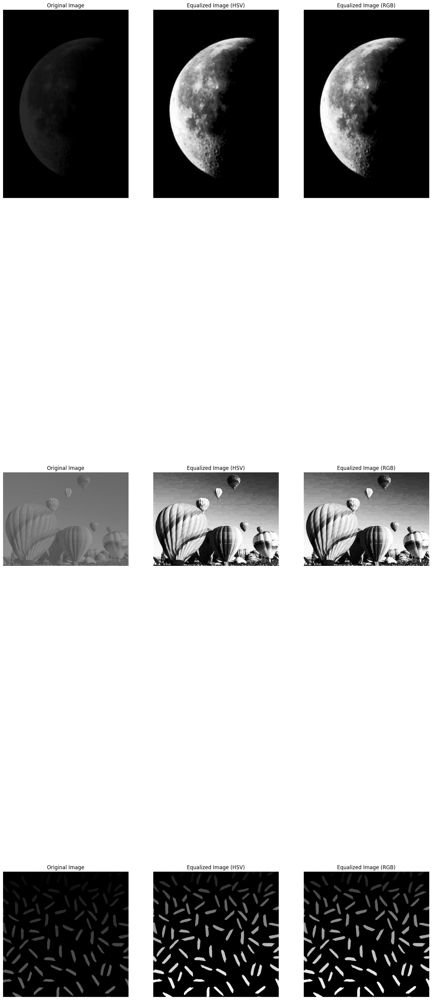

In [11]:
### YOUR CODE HERE ###

# making subplots
fig, ax = plt.subplots(3, 3, figsize=(18, 50))

for i, img_name in enumerate(img_names):
    if i==3: break

    img = cv2.imread(os.path.join('testdata/', img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_eq = EqHist(img)
    img_eq_rgb = EqHist_RGB(img)
    
    ax[i, 0].imshow(img)
    ax[i, 0].set_title('Original Image')
    ax[i, 0].axis('off')
    
    ax[i, 1].imshow(img_eq)
    ax[i, 1].set_title('Equalized Image (HSV)')
    ax[i, 1].axis('off')
    
    ax[i, 2].imshow(img_eq_rgb)
    ax[i, 2].set_title('Equalized Image (RGB)')
    ax[i, 2].axis('off')
plt.show()

# Yêu cầu 2
Hoàn thiện hàm Gamma để tăng cường độ tương phản cho ảnh đầu vào với trường hợp ảnh đầu vào (ảnh màu hoặc ảnh đa mức xám). Lưu ý việc sử dụng không gian màu phù hợp khi làm việc với ảnh màu. Học viên cần thử làm việc với không gian màu và so sánh kết quả thu được.

In [23]:
def Gamma_RGB(img,gama):
    # if input image is gray image
    if(len(img.shape)==2):
        outImg = gamma_correction(img, gama)
    
    # if input image is color image
    ### YOUR CODE HERE ###
    elif(len(img.shape)==3):
        outImg = np.zeros((img.shape[0],img.shape[1],3),dtype=np.uint8)
        for channel in range(img.shape[2]):
            outImg[:, :, channel] = gamma_correction(img[:, :, channel],gama)  
    ### YOUR CODE HERE ###

    return outImg

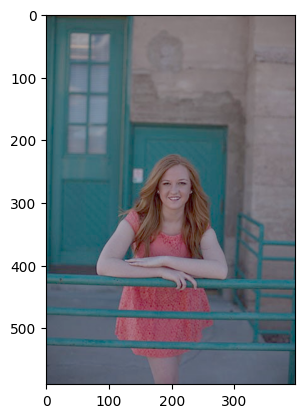

In [24]:
img = cv2.imread('testdata/girl1_dark.jpg')
img_gama = Gamma_RGB(img,0.5)
plt.imshow(cv2.cvtColor(img_gama, cv2.COLOR_BGR2RGB))

In [25]:
def Gamma(img,gamma):
    # if input image is gray image
    if(len(img.shape)==2):
        outImg =gamma_correction(img, gamma)
    
    # if input image is color image
          
    ### YOUR CODE HERE ###
    elif(len(img.shape)==3):
        hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        hsv[:,:,2] = gamma_correction(hsv[:,:,2], gamma)
        outImg = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)    
    ### YOUR CODE HERE ###

    return outImg

In [12]:
# making subplots
fig, ax = plt.subplots(len(img_names), 3, figsize=(18, 50))

for i, img_name in enumerate(img_names):
    img = cv2.imread(os.path.join('testdata/', img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_eq = EqHist(img)
    img_eq_rgb = EqHist_RGB(img)
    
    ax[i, 0].imshow(img)
    ax[i, 0].set_title('Original Image')
    ax[i, 0].axis('off')
    
    ax[i, 1].imshow(img_eq)
    ax[i, 1].set_title('Equalized Image (HSV)')
    ax[i, 1].axis('off')
    
    ax[i, 2].imshow(img_eq_rgb)
    ax[i, 2].set_title('Equalized Image (RGB)')
    ax[i, 2].axis('off')
plt.show()

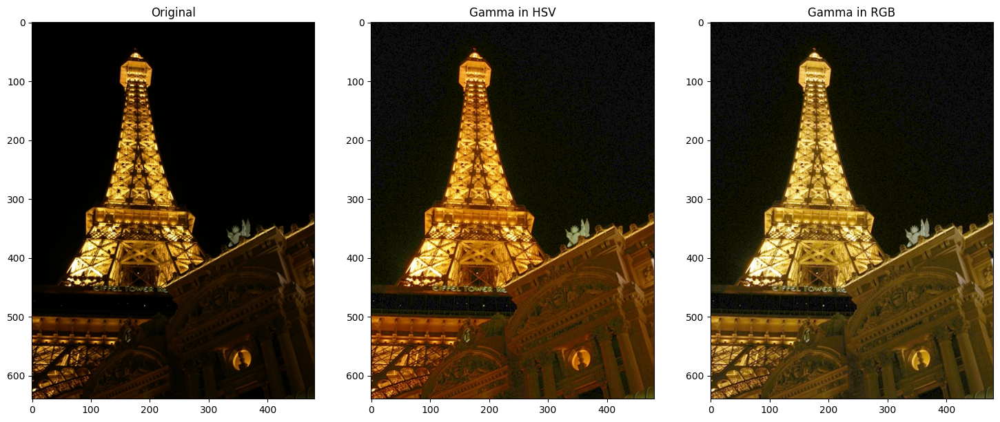

In [27]:
## Thực hiện cân bằng histogram và hiệu chỉnh gama trên ảnh màu
img = cv2.imread('testdata/z01.jpg')
#img = cv2.imread('testdata/z03.jpg')
#img = cv2.imread('testdata/girl1_dark.jpg')
gama = 0.5
img_gamma = Gamma(img,gama)
img_gamma_rgb = Gamma_RGB(img, gama)

# making subplots
fig, ax = plt.subplots(1, 3, figsize=(18, 50))
# img = cv2.imread(os.path.join('testdata/', img_name))

gama = 0.5
img_gamma = Gamma(img,gama)
img_gamma_rgb = Gamma_RGB(img, gama)
    
ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title("Original")

ax[1].imshow(cv2.cvtColor(img_gamma, cv2.COLOR_BGR2RGB))
ax[1].set_title("Gamma in HSV")

ax[2].imshow(cv2.cvtColor(img_gamma_rgb, cv2.COLOR_BGR2RGB))
ax[2].set_title("Gamma in RGB")

plt.show()



# Yêu cầu
- Lấy danh sách tên ảnh trong folder testdata
- Loop qua từng ảnh, đọc ảnh và tăng cường độ tương phản của ảnh màu theo 2 phương pháp đã cài đặt ở trên
- Hiển thị ảnh kết quả

In [29]:


def contrastEnhancementDisplay(gamma):
    
    ### YOUR CODE HERE ###
    # making subplots
    fig, ax = plt.subplots(len(img_names), 3, figsize=(18, 50))

    for i, img_name in enumerate(img_names):
        img = cv2.imread(os.path.join('testdata/', img_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_gamma_hsv = Gamma(img, gamma)
        img_gamma_rgb = Gamma_RGB(img, gamma)
        
        ax[i, 0].imshow(img)
        ax[i, 0].set_title('Original Image')
        ax[i, 0].axis('off')
        
        ax[i, 1].imshow(img_gamma_hsv)
        ax[i, 1].set_title(f'Gamma (HSV), gamma = {gamma}')
        ax[i, 1].axis('off')
        
        ax[i, 2].imshow(img_gamma_rgb)
        ax[i, 2].set_title(f'Gamma (RGB), gamma = {gamma}')
        ax[i, 2].axis('off')
    plt.show()
        
    ### YOUR CODE HERE ###
    return None

Gamma correction, gamma = 0.25

In [13]:
# test with gamma = 0.25 and 0.5
gamma = 0.25
contrastEnhancementDisplay(gamma)

Gamma correction, gamma = 0.5

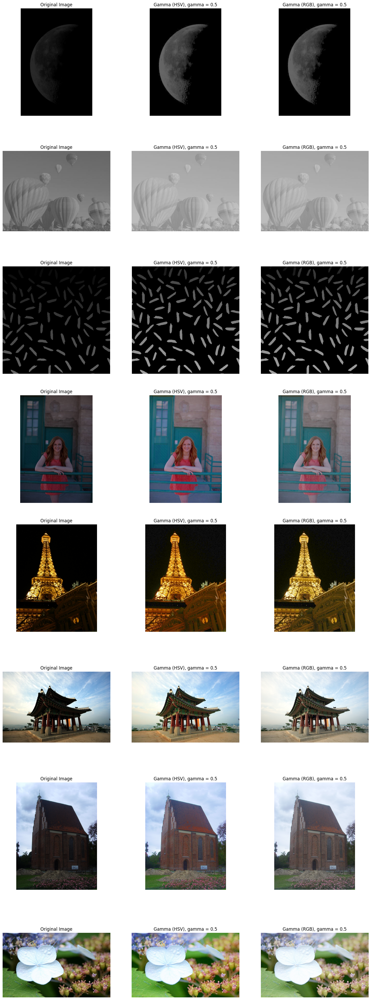

In [31]:
# test with gamma = 0.5
gamma = 0.5
contrastEnhancementDisplay(gamma)

# Cân bằng mức xám động

In [143]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors
import imageio
import scipy, scipy.misc, scipy.signal
import cv2
import sys

# Yêu cầu
Hoàn thiện hàm build_is_hist và dhe

Tài liệu tham khảo: https://www.researchgate.net/publication/3183129_A_Dynamic_Histogram_Equalization_for_Image_Contrast_Enhancement

In [146]:
def build_is_hist(img):
    hei = img.shape[0]
    wid = img.shape[1]
    ch = img.shape[2]
    Img = np.zeros((hei+4, wid+4, ch))
    for i in range(ch):
        Img[:,:,i] = np.pad(img[:,:,i], (2,2), 'edge')
    hsv = (matplotlib.colors.rgb_to_hsv(Img))
    hsv[:,:,0] = hsv[:,:,0] * 255
    hsv[:,:,1] = hsv[:,:,1] * 255
    hsv[hsv>255] = 255
    hsv[hsv<0] = 0
    hsv = hsv.astype(np.uint8).astype(np.float64)
    fh = np.array([[-1.0,0.0,1.0],[-2.0,0.0,2.0],[-1.0,0.0,1.0]])
    fv = fh.conj().T
    
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    I = hsv[:,:,2]

    dIh = scipy.signal.convolve2d(I, np.rot90(fh, 2), mode='same')
    dIv = scipy.signal.convolve2d(I, np.rot90(fv, 2), mode='same')
    dIh[dIh==0] = 0.00001
    dIv[dIv==0] = 0.00001
    dI = np.sqrt(dIh**2+dIv**2).astype(np.uint32)
    di = dI[2:hei+2,2:wid+2]
    
    dSh = scipy.signal.convolve2d(S, np.rot90(fh, 2), mode='same')
    dSv = scipy.signal.convolve2d(S, np.rot90(fv, 2), mode='same')
    dSh[dSh==0] = 0.00001
    dSv[dSv==0] = 0.00001
    dS = np.sqrt(dSh**2+dSv**2).astype(np.uint32)
    ds = dS[2:hei+2,2:wid+2]

    
    h = H[2:hei+2,2:wid+2]
    s = S[2:hei+2,2:wid+2]
    i = I[2:hei+2,2:wid+2].astype(np.uint8)
    
    Imean = scipy.signal.convolve2d(I,np.ones((5,5))/25, mode='same')
    Smean = scipy.signal.convolve2d(S,np.ones((5,5))/25, mode='same')
    
    Rho = np.zeros((hei+4,wid+4))
    for p in range(2,hei+2):
        for q in range(2,wid+2):
            tmpi = I[p-2:p+3,q-2:q+3]
            tmps = S[p-2:p+3,q-2:q+3]
            corre = np.corrcoef(tmpi.flatten('F'),tmps.flatten('F'))
            Rho[p,q] = corre[0,1]
    
    rho = np.abs(Rho[2:hei+2,2:wid+2])
    rho[np.isnan(rho)] = 0
    rd = (rho*ds).astype(np.uint32)
    Hist_I = np.zeros((256,1))
    Hist_S = np.zeros((256,1))
    
    for n in range(0,255):
        temp = np.zeros(di.shape)
        temp[i==n] = di[i==n]
        Hist_I[n+1] = np.sum(temp.flatten('F'))
        temp = np.zeros(di.shape)
        temp[i==n] = rd[i==n]
        Hist_S[n+1] = np.sum(temp.flatten('F'))
    return Hist_I, Hist_S

In [148]:
def dhe(img, alpha=0.5):
    hist_i, hist_s = build_is_hist(img)
    hist_c = alpha*hist_s + (1-alpha)*hist_i
    hist_sum = np.sum(hist_c)
    hist_cum = hist_c.cumsum(axis=0)
    
    hsv = matplotlib.colors.rgb_to_hsv(img)
    h = hsv[:,:,0]
    s = hsv[:,:,1]
    i = hsv[:,:,2].astype(np.uint8)
    
    c = hist_cum / hist_sum
    s_r = (c * 255)
    i_s = np.zeros(i.shape)
    for n in range(0,255):
        i_s[i==n] = s_r[n+1]/255.0
    i_s[i==255] = 1
    hsi_o = np.stack((h,s,i_s), axis=2)
    result = matplotlib.colors.hsv_to_rgb(hsi_o)
    
    result = result * 255
    result[result>255] = 255
    result[result<0] = 0
    return result.astype(np.uint8)

## Tăng cường độ tương phản sử dụng DHE

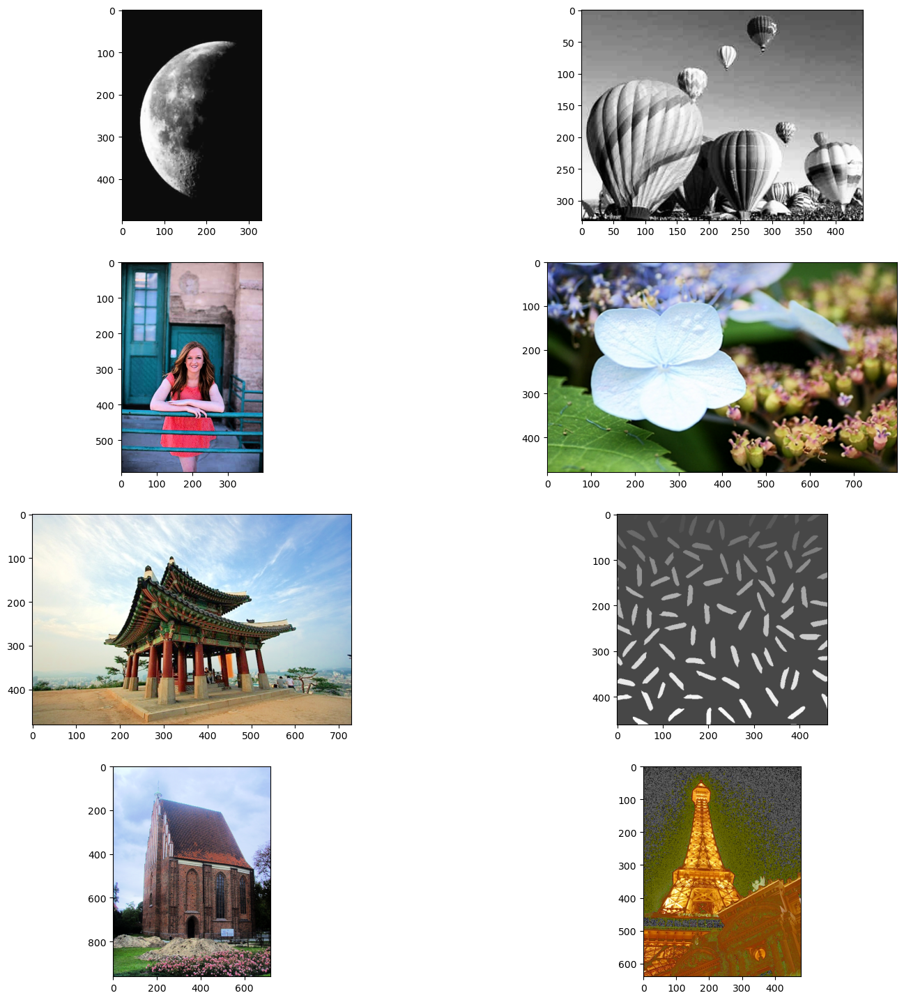

In [150]:
# test on all images with DHE
### YOUR CODE HERE ###
....
### YOUR CODE HERE ###

# Comparison between various methods


- Lấy danh sách tên ảnh trong folder testdata
- Loop qua từng ảnh, đọc ảnh và tăng cường độ tương phản của ảnh màu theo equalization, gamma correction, dhe
- Hiển thị ảnh kết quả

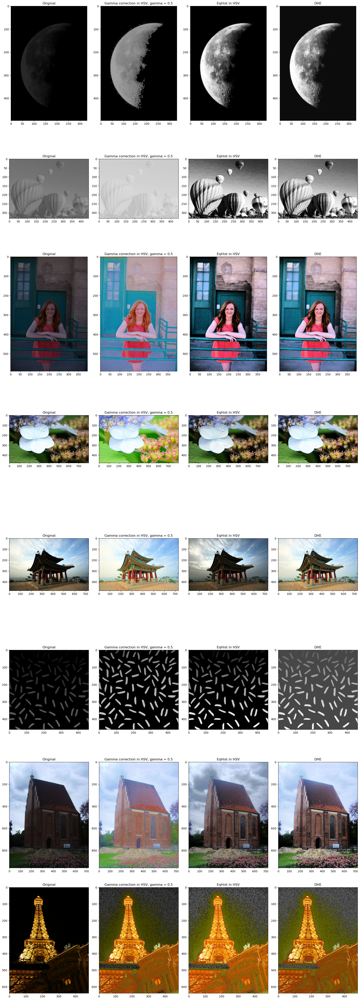

In [158]:
### YOUR CODE HERE ###

...

### YOUR CODE HERE ###